<a href="https://colab.research.google.com/github/SamuelMiller413/Deep-Learning-Course/blob/main/DL_13_Image_augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%capture
!pip install -Uqq fastai

In [ ]:
from fastai.vision.all import *
from fastai import *
from fastai.callback.tensorboard import TensorBoardCallback
import albumentations as alb
import torch
from torch import nn
import matplotlib.pyplot as plt
from torchvision import transforms as T
import warnings

warnings.filterwarnings('ignore')

In [ ]:
plt.rcParams['figure.figsize'] = (10,10)

def remove_ticks(ax):
    ax.set_xticklabels([])
    ax.set_xticks([])
    ax.set_yticklabels([])
    ax.set_yticks([])
    for s in ['top','bottom','left','right']:
        ax.spines[s].set_visible(False)

In [ ]:
path = untar_data(URLs.PETS)

In [ ]:
def label_func(name):
    return '_'.join(name.split('_')[:-1])

In [ ]:
files = get_image_files(path/'images')
list(files[:5])

[Path('/root/.fastai/data/oxford-iiit-pet/images/havanese_36.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Egyptian_Mau_7.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Abyssinian_97.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/chihuahua_135.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/keeshond_110.jpg')]

In [ ]:
# original
tfms = alb.Compose([
    alb.Resize(224, 224),
    alb.RandomBrightness(.5),
    alb.RandomContrast(.5),
    alb.RandomScale(.5),
    alb.Rotate(45),
])

# alternate
tfms_alt = alb.Compose([
    alb.Resize(224, 224),
    alb.RandomRain(.5),
    alb.RandomSunFlare(),
    alb.Superpixels(.5),
    alb.ToSepia(45),
])

havanese


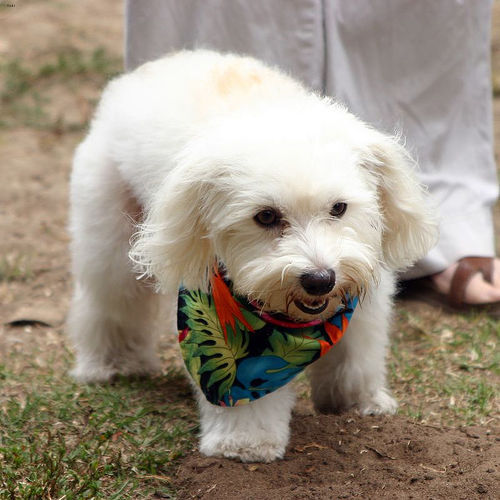

In [ ]:
img_path = files[0]
img_label = label_func(img_path.name)
img = load_image(img_path)
print(img_label)
img

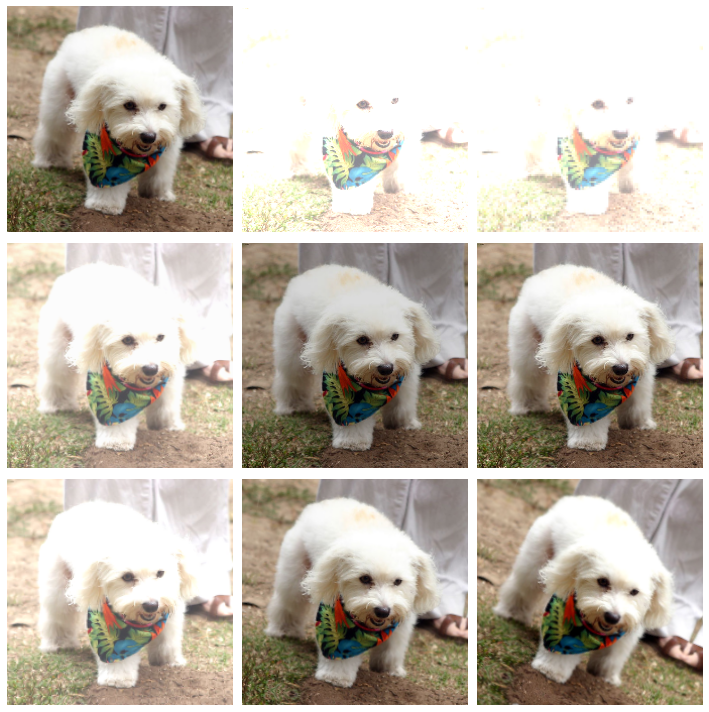

In [ ]:
# original 
fig = plt.figure()
# We want 9 samples. For each sample...
for i in range(9):
    # Add an axes
    ax = fig.add_subplot(3, 3, 1+i)
    # get the transformed image using tfms
    transformed = tfms(image=np.array(img)) 
    # turn the transformed image back into a PIL.Image and show it
    ax.imshow(Image.fromarray(transformed['image']))
    # Get rid of ticks and tick labels
    remove_ticks(ax)
fig.tight_layout()

# Exercise 13.1

Please explore the full list of transforms in the [`albumentations` documentation](https://albumentations.ai/docs/getting_started/transforms_and_targets/).
Try adding or replacing at least 3 transforms in the `tfms` object and re-run the code to familiarize yourself with what they do.

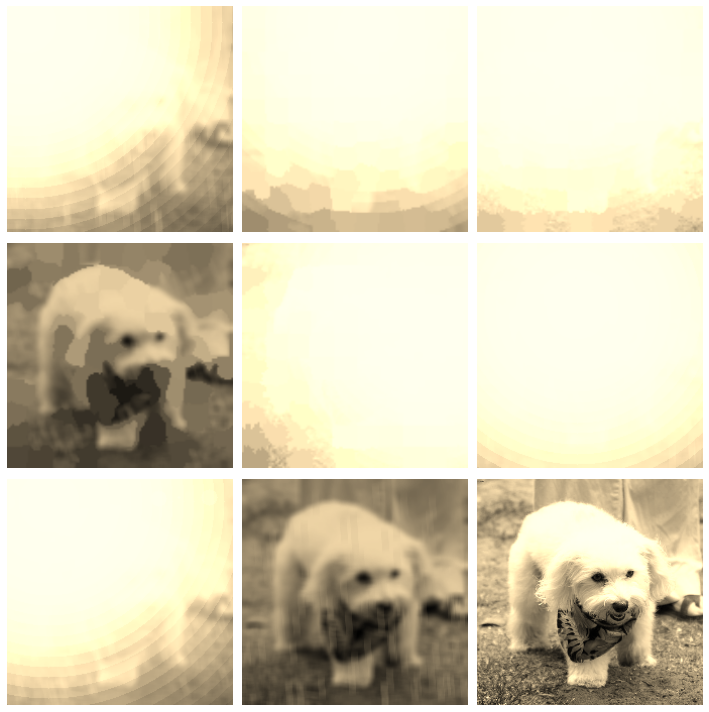

In [ ]:
# No code required here.
# Please modify the code above.

# alternate
fig = plt.figure()
# We want 9 samples. For each sample...
for i in range(9):
    # Add an axes
    ax = fig.add_subplot(3, 3, 1+i)
    # get the transformed image using tfms
    transformed = tfms_alt(image=np.array(img)) 
    # turn the transformed image back into a PIL.Image and show it
    ax.imshow(Image.fromarray(transformed['image']))
    # Get rid of ticks and tick labels
    remove_ticks(ax)
fig.tight_layout()

torchvision

In [ ]:
# original
ttfms = T.Compose([
    T.ToTensor(), #Convert from image to tensor
    T.Resize((224, 224)),
    T.RandomRotation(45, ),
    T.RandomPerspective(distortion_scale=.1),
    T.ColorJitter(brightness=.2, contrast=.2, saturation=.2, hue=.1),
    T.ToPILImage() # At the end of the pipeline, convert the tensor back to an image
])

# alternate
ttfms_alt = T.Compose([
    T.ToTensor(), #Convert from image to tensor
    T.Resize((224, 224)),
    # T.FiveCrop(),
    T.RandomInvert(p=.2),
    T.Grayscale(),
    T.RandomPerspective(distortion_scale=0.7),
    T.ToPILImage() # At the end of the pipeline, convert the tensor back to an image
])

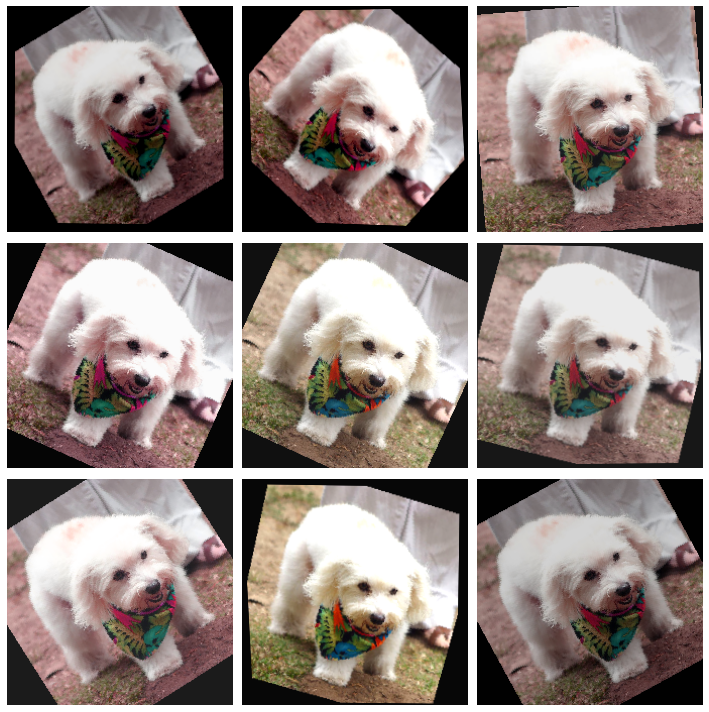

In [ ]:
fig = plt.figure()
for i in range(9):
    ax = fig.add_subplot(3, 3, 1+i)
    ax.imshow(ttfms(img))
    remove_ticks(ax)
fig.tight_layout()

# Exercise 13.2

Please explore the full list of transforms in the [`torchvision` documentation](https://pytorch.org/vision/stable/transforms.html#).
Try adding or replacing at least 3 transforms in the `tfms` object and re-run the code to familiarize yourself with what they do.

<!-- startquestion -->

In [ ]:
ttfms_alt

Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=None)
    FiveCrop(size=(0, 0))
    RandomPerspective(p=0.5)
    ToPILImage()
)

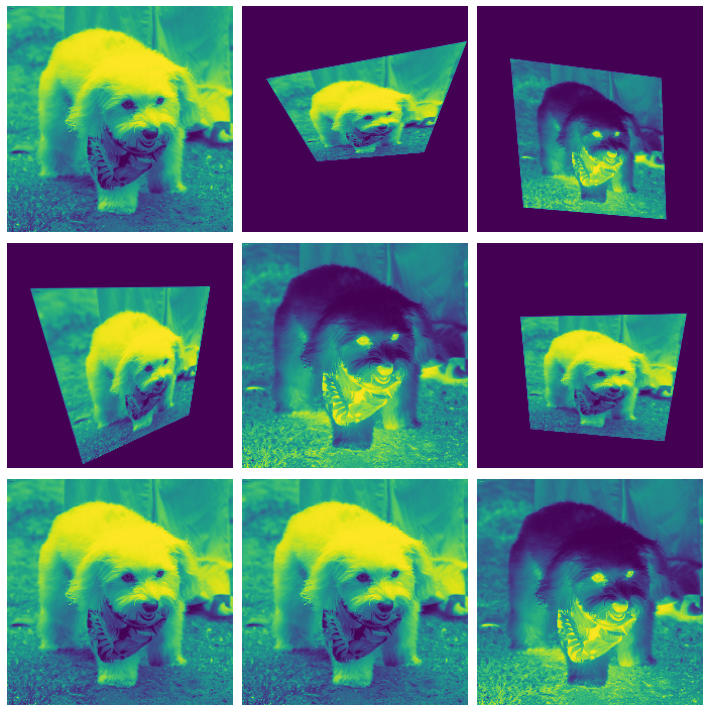

In [ ]:
# No code required here.
# Please modify the code above.

# alternate
fig = plt.figure()
for i in range(9):
    ax = fig.add_subplot(3, 3, 1+i)
    ax.imshow(ttfms_alt(img))
    remove_ticks(ax)
fig.tight_layout()

In [ ]:
help(aug_transforms)

Help on function aug_transforms in module fastai.vision.augment:

aug_transforms(mult: 'float' = 1.0, do_flip: 'bool' = True, flip_vert: 'bool' = False, max_rotate: 'float' = 10.0, min_zoom: 'float' = 1.0, max_zoom: 'float' = 1.1, max_lighting: 'float' = 0.2, max_warp: 'float' = 0.2, p_affine: 'float' = 0.75, p_lighting: 'float' = 0.75, xtra_tfms: 'list' = None, size: 'int | tuple' = None, mode: 'str' = 'bilinear', pad_mode='reflection', align_corners=True, batch=False, min_scale=1.0)
    Utility func to easily create a list of flip, rotate, zoom, warp, lighting transforms.



In [ ]:
dls = ImageDataLoaders.from_name_func(
    path, 
    files, 
    label_func=label_func,
    item_tfms=Resize(224),
    batch_tfms=aug_transforms(size=224, max_lighting=0.8, max_warp=0.5, max_zoom=2.)
)

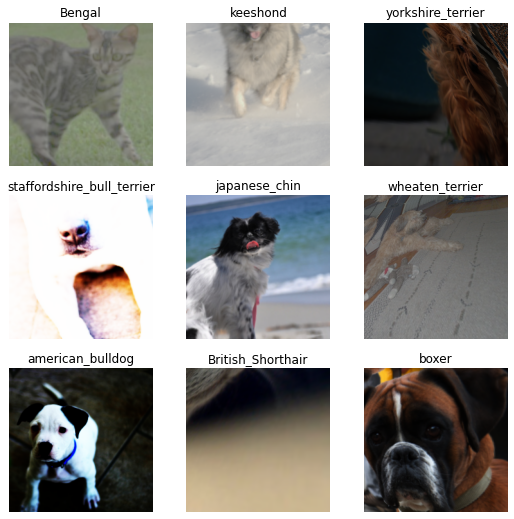

In [ ]:
dls.show_batch()

In [ ]:
!rm -r runs
BASE_LOGDIR = Path('./runs')
if not BASE_LOGDIR.exists():
    BASE_LOGDIR.mkdir()

def build_learner(dls, exp_name:str):
    logdir = BASE_LOGDIR/exp_name
    cbs = [TensorBoardCallback(log_dir=logdir)]
    return cnn_learner(dls, resnet18, metrics=[accuracy, error_rate], cbs=cbs)

rm: cannot remove 'runs': No such file or directory


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 455), started 0:23:17 ago. (Use '!kill 455' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
dls = ImageDataLoaders.from_name_func(
    path, 
    files, 
    label_func=label_func,
    item_tfms=Resize(224),
    batch_tfms=Normalize.from_stats(*imagenet_stats)
)

In [ ]:
learn = build_learner(dls, 'no_tfms')

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

In [ ]:
learn.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.560240,0.408999,0.870095,0.129905,00:47


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.485622,0.335322,0.890392,0.109608,00:50
1,0.364846,0.322103,0.899188,0.100812,00:50
2,0.279328,0.321034,0.895805,0.104195,00:50
3,0.177933,0.338757,0.893775,0.106225,00:49
4,0.119148,0.310197,0.903924,0.096076,00:50
5,0.073441,0.321030,0.910690,0.089310,00:50
6,0.050472,0.293114,0.916103,0.083897,00:49
7,0.031855,0.290013,0.920162,0.079838,00:49
8,0.019670,0.291501,0.921516,0.078484,00:50
9,0.019997,0.293114,0.921516,0.078484,00:49


In [ ]:
dls = ImageDataLoaders.from_name_func(
    path, 
    files, 
    label_func=label_func,
    item_tfms=Resize(224),
    batch_tfms=aug_transforms(size=224)
)

In [ ]:
learn = build_learner(dls, 'with_tfms')

In [ ]:
learn.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.605698,0.415472,0.857916,0.142084,00:48


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.552785,0.326863,0.897835,0.102165,00:53
1,0.434337,0.312625,0.895805,0.104195,00:51
2,0.363781,0.325576,0.904601,0.095399,00:50
3,0.303097,0.299612,0.903924,0.096076,00:52
4,0.228139,0.347497,0.897158,0.102842,00:49
5,0.162920,0.283089,0.918133,0.081867,00:49
6,0.114048,0.274125,0.921516,0.078484,00:49
7,0.088930,0.275827,0.922192,0.077808,00:50
8,0.070711,0.275688,0.923545,0.076455,00:49
9,0.065948,0.270861,0.926252,0.073748,00:50
